<a href="https://colab.research.google.com/github/kaiesalmahmud/ComputerVision/blob/main/SmartParking_yolov8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Mon Feb  6 09:38:07 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.47.03    Driver Version: 510.47.03    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   54C    P0    26W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
!pip install ultralytics==8.0.20

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 23.6/78.2 GB disk)


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

# YOLO API Testing

In [ ]:
# ! yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='https://media.roboflow.com/notebooks/examples/dog.jpeg' save=True

# Image(filename='runs/detect/predict/dog.jpeg', height=600)

In [ ]:
# model = YOLO(f'{HOME}/yolov8n.pt')
# results = model.predict(source='https://media.roboflow.com/notebooks/examples/dog.jpeg', conf=0.25)

# print('\nxyxy:\n', results[0].boxes.xyxy)
# print('\nconf:\n', results[0].boxes.conf)
# print('\ncls:\n', results[0].boxes.cls)

# Download dataset

Link: https://universe.roboflow.com/public-workspace-uikcy/parking-vehicles/dataset/11


In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Ox5BzYRtVStwJID8gQ65")
project = rf.workspace("public-workspace-uikcy").project("parking-vehicles")
dataset = project.version(11).download("yolov8")

/content/datasets
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.0/49.0 KB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 KB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 KB 5.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9674 sha256=a0f47f973f7a2de7a2cc8beae653552a585d70806e3d399f47e110cb963ccf24
  Stored in directory: /root/.cache/pip/wheels/bd/a8/c3/3cf2c14a1837a4e04bd98631724e81f33f462d86a1d895fae0
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pyparsing-3.0.9:
      Successfully uninstalled pyparsing-3.0.9
  Attempting uninstall: cycler
    Found existing installation: cycler 0.11.0
    Uninstalling cycler-0.11.0:
      Successfully uninstalled cycler-0.11.0


loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Parking-Vehicles-11 in yolov8:: 100%|██████████| 4058/4058 [00:01<00:00, 2102.50it/s]


# Model evaluation without training

## Validate

In [ ]:
%cd {HOME}

!yolo task=detect mode=val model=yolov8n.pt data={dataset.location}/data.yaml

/content
100% 6.23M/6.23M [00:01<00:00, 5.27MB/s]

Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs
100% 755k/755k [00:00<00:00, 22.0MB/s]
val: Scanning /content/datasets/Parking-Vehicles-11/valid/labels... 349 images, 0 backgrounds, 0 corrupt: 100% 349/349 [00:00<00:00, 2223.90it/s]
val: WARNING ⚠️ /content/datasets/Parking-Vehicles-11/valid/images/0-0025_jpg.rf.031ffc0f654e501d485fd3ef0e775d75.jpg: 7 duplicate labels removed
val: New cache created: /content/datasets/Parking-Vehicles-11/valid/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 22/22 [00:09<00:00,  2.35it/s]
                   all        349       4278     0.0178       0.52     0.0145    0.00781
                person        349       4213     0.0339      0.162     0.0211    0.00993
                   car        349         65    0.00162      0.87

/content


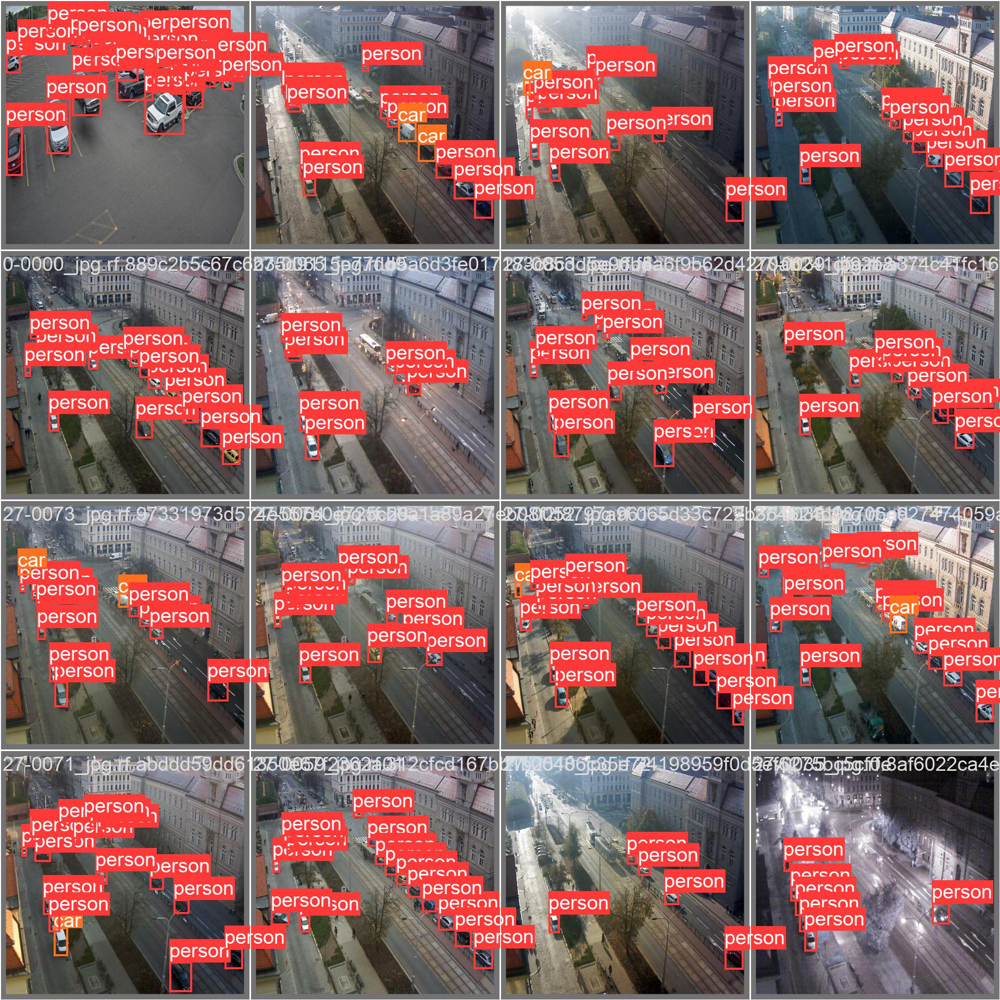

In [ ]:
%cd {HOME}
Image(filename='/content/runs/detect/val/val_batch0_labels.jpg', width=600)

/content


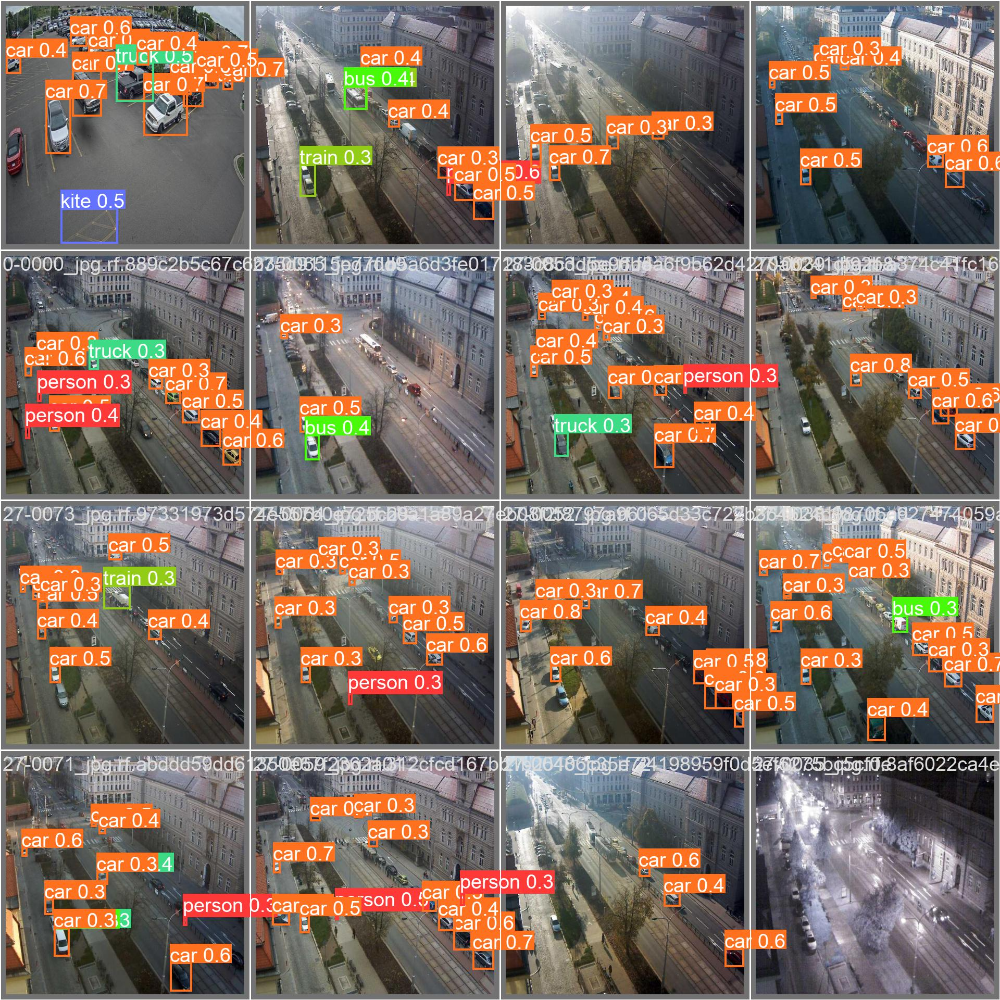

In [ ]:
%cd {HOME}
Image(filename='/content/runs/detect/val/val_batch0_pred.jpg', width=600)

/content


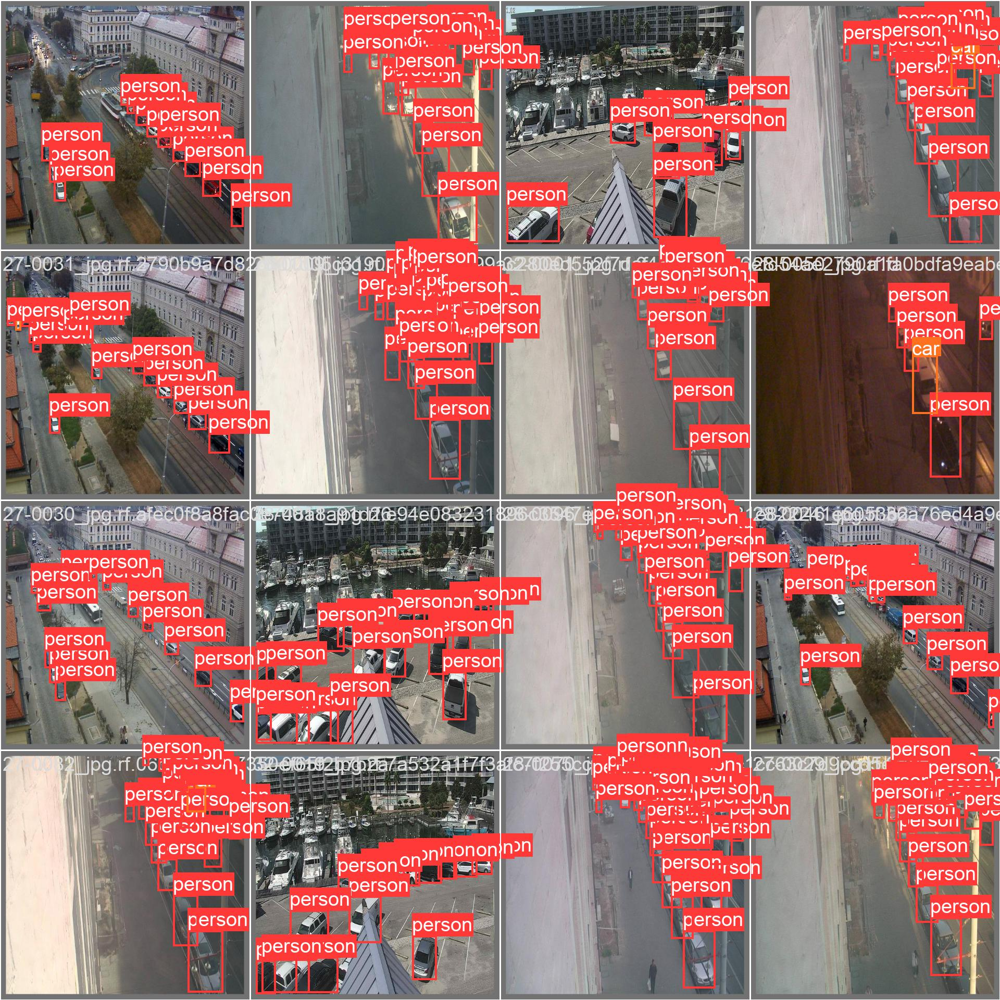

In [ ]:
%cd {HOME}
Image(filename='/content/runs/detect/val/val_batch1_labels.jpg', width=600)

/content


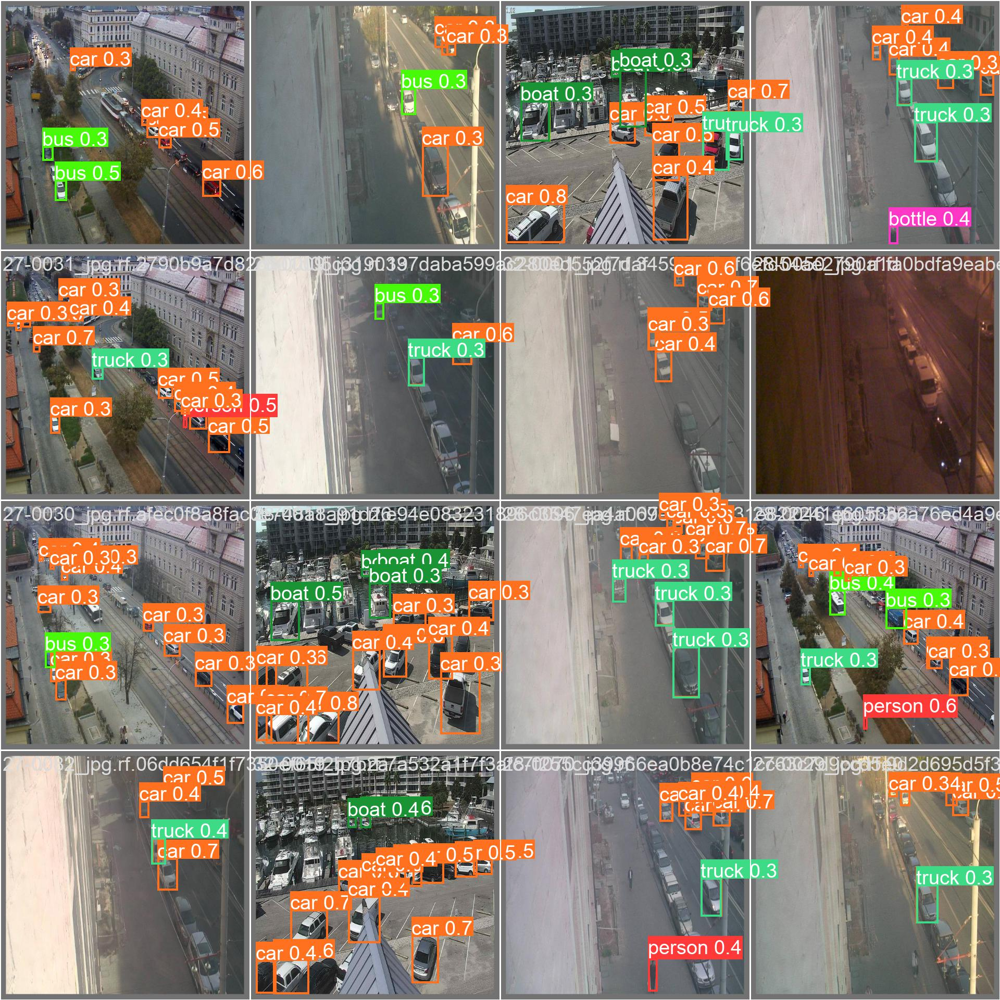

In [ ]:
%cd {HOME}
Image(filename='/content/runs/detect/val/val_batch1_pred.jpg', width=600)

/content


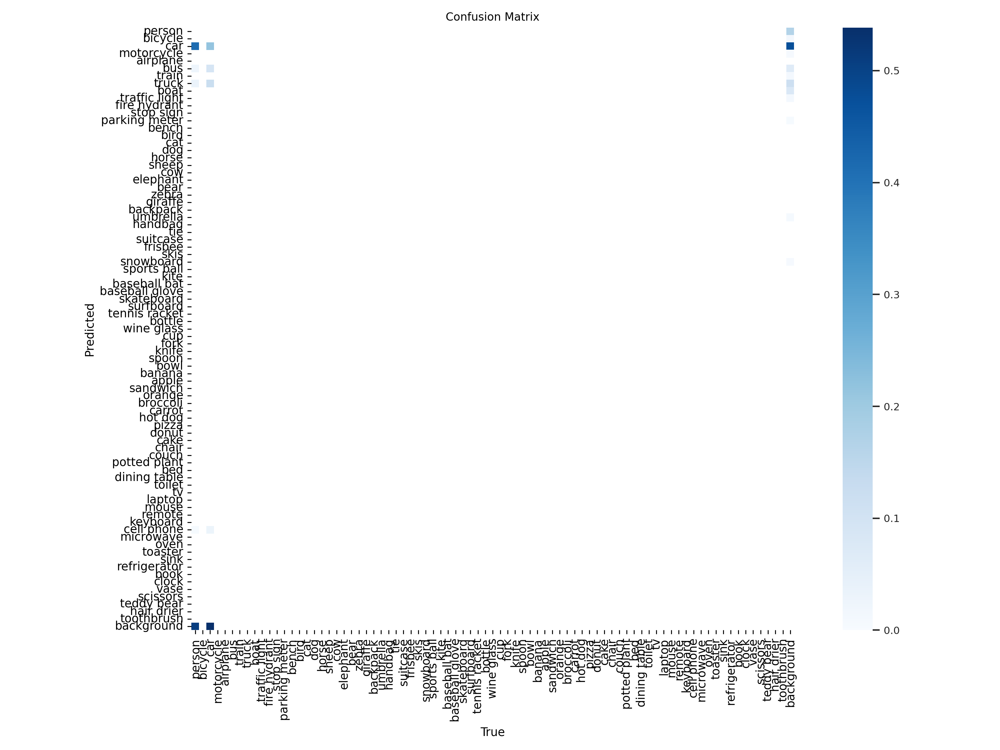

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/val/confusion_matrix.png', width=600)

## Predict on test set

In [ ]:
# %cd {HOME}
# !yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source={dataset.location}/test/images save=True

In [ ]:
# # Download inference results

# !zip -r /content/without_training.zip /content/runs/detect/predict

# from google.colab import files
# files.download('/content/without_training.zip')

# Model Evaluation after training

## Train

In [ ]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8n.pt data={dataset.location}/data.yaml epochs=10 imgsz=640 plots=True

/content
Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/content/datasets/Parking-Vehicles-11/data.yaml, epochs=10, patience=50, batch=16, imgsz=640, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dyn

/content


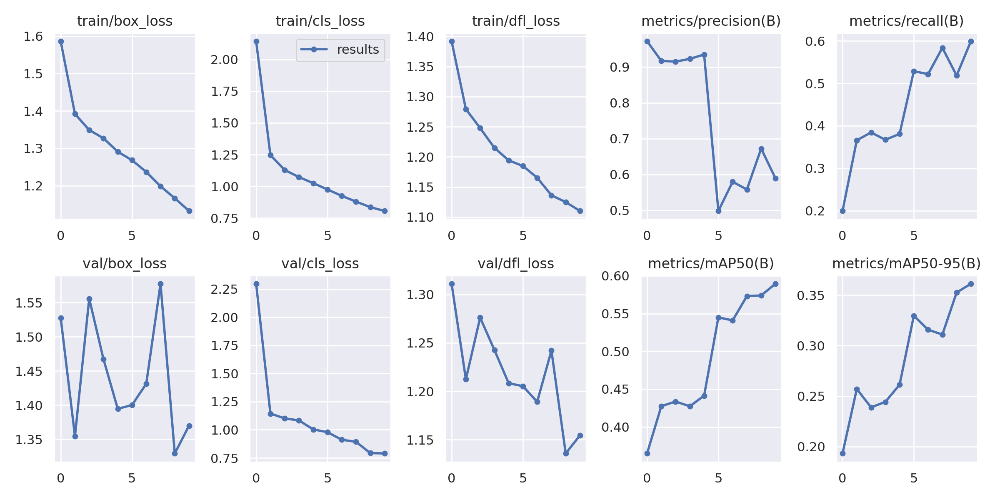

In [ ]:
%cd {HOME}
Image(filename='/content/runs/detect/train/results.png', width=600)

/content


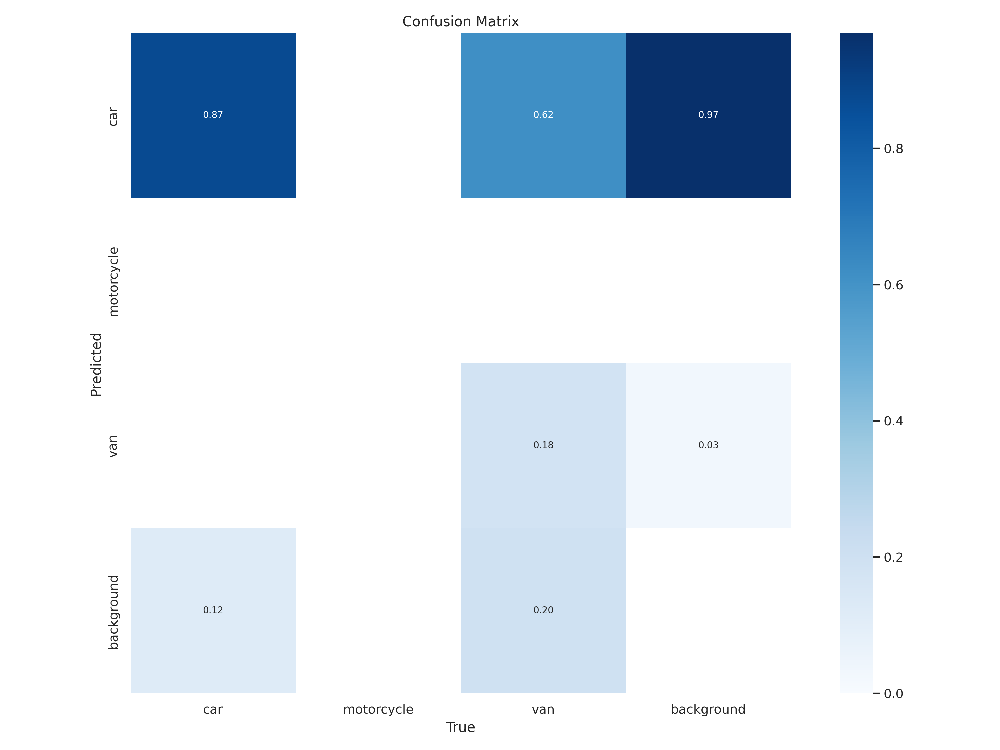

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

## Validate

In [ ]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Model summary (fused): 168 layers, 3006233 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/datasets/Parking-Vehicles-11/valid/labels.cache... 349 images, 0 backgrounds, 0 corrupt: 100% 349/349 [00:00<?, ?it/s]
val: WARNING ⚠️ /content/datasets/Parking-Vehicles-11/valid/images/0-0025_jpg.rf.031ffc0f654e501d485fd3ef0e775d75.jpg: 7 duplicate labels removed
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 22/22 [00:07<00:00,  2.96it/s]
                   all        349       4278       0.59      0.601      0.589       0.36
                   car        349       4213      0.818      0.879      0.922      0.555
                   van        349         65      0.361      0.322      0.257      0.166
Speed: 0.5ms pre-process, 5.0ms inference, 0.0ms loss, 2.0ms post-process per image


/content


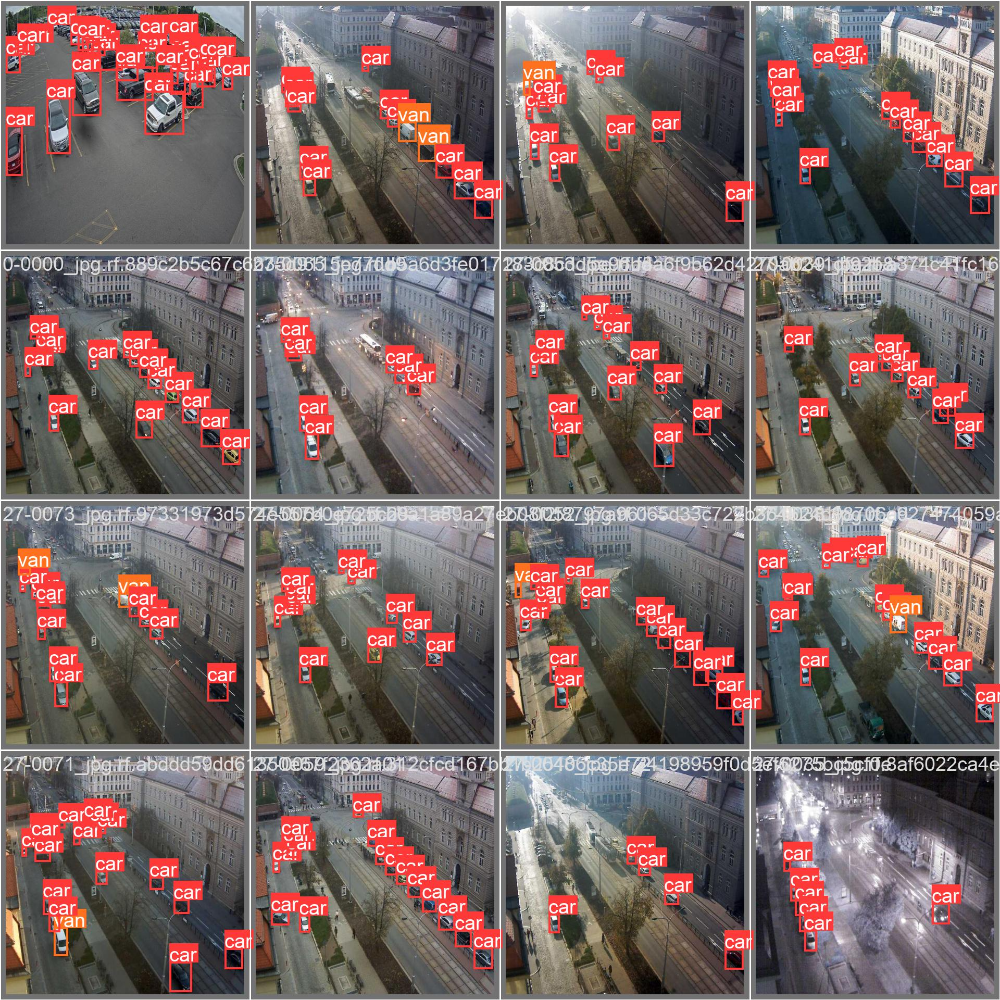

In [ ]:
%cd {HOME}
Image(filename='/content/runs/detect/val2/val_batch0_labels.jpg', width=600)

/content


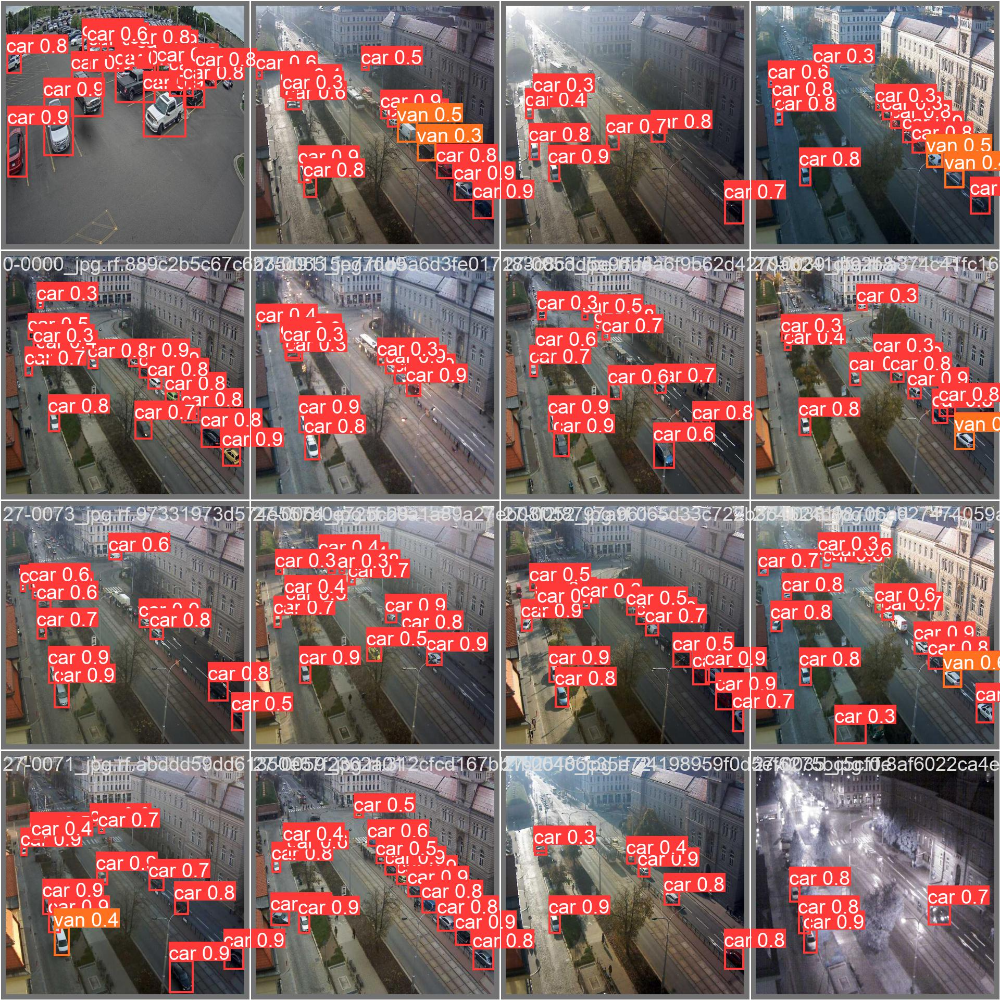

In [ ]:
%cd {HOME}
Image(filename='/content/runs/detect/val2/val_batch0_pred.jpg', width=600)

/content


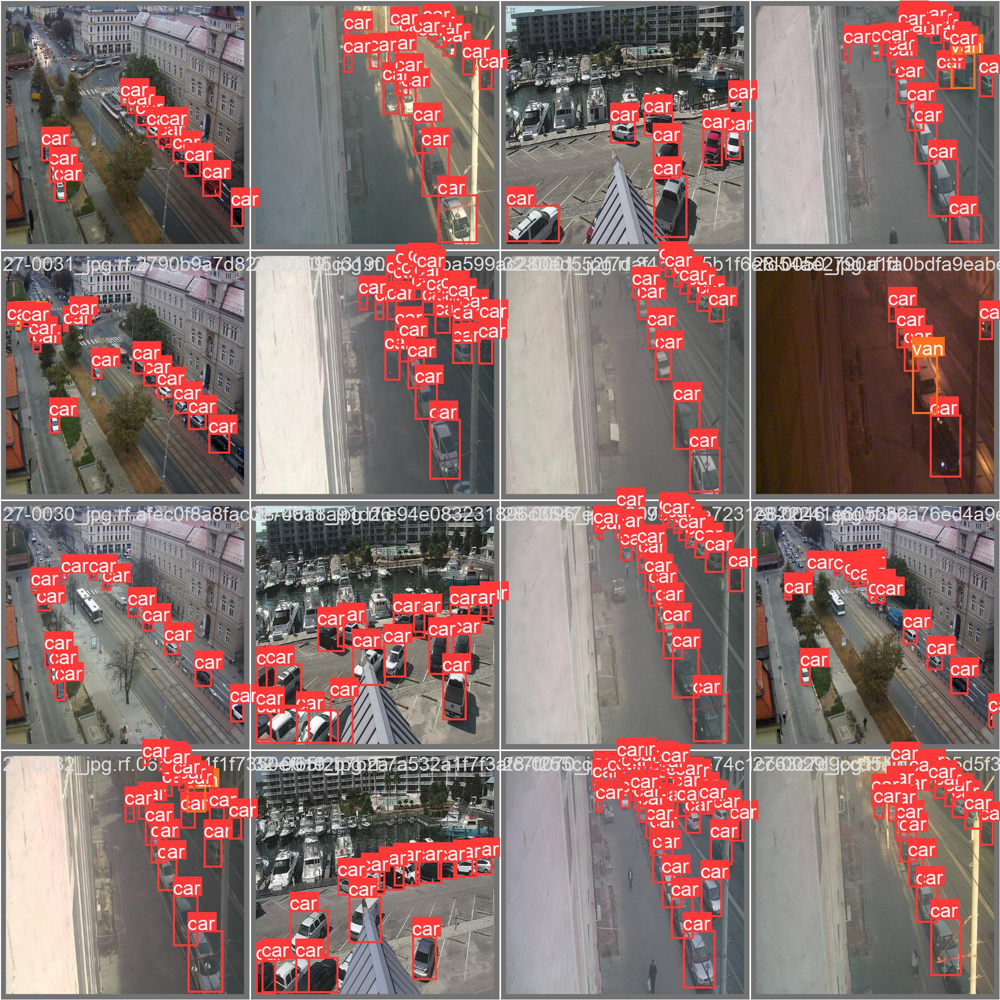

In [ ]:
%cd {HOME}
Image(filename='/content/runs/detect/val2/val_batch1_labels.jpg', width=600)

/content


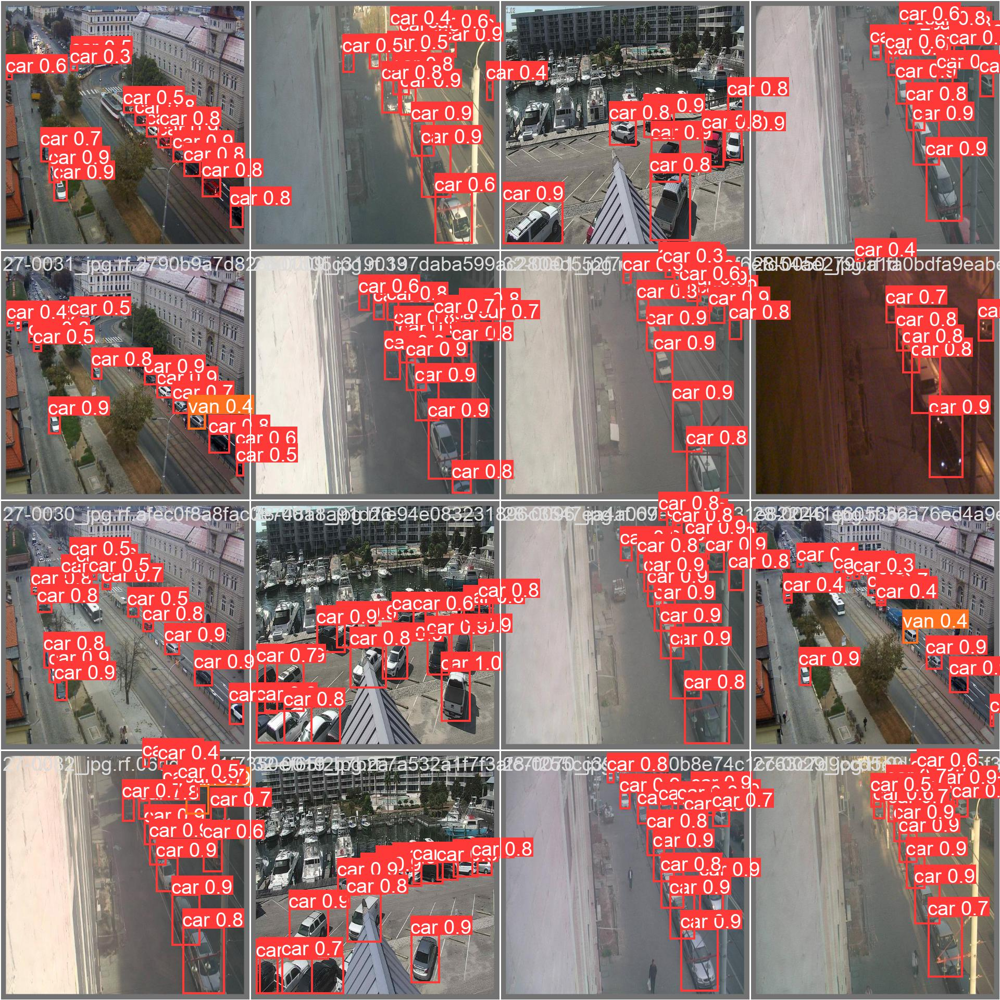

In [ ]:
%cd {HOME}
Image(filename='/content/runs/detect/val2/val_batch1_pred.jpg', width=600)

/content


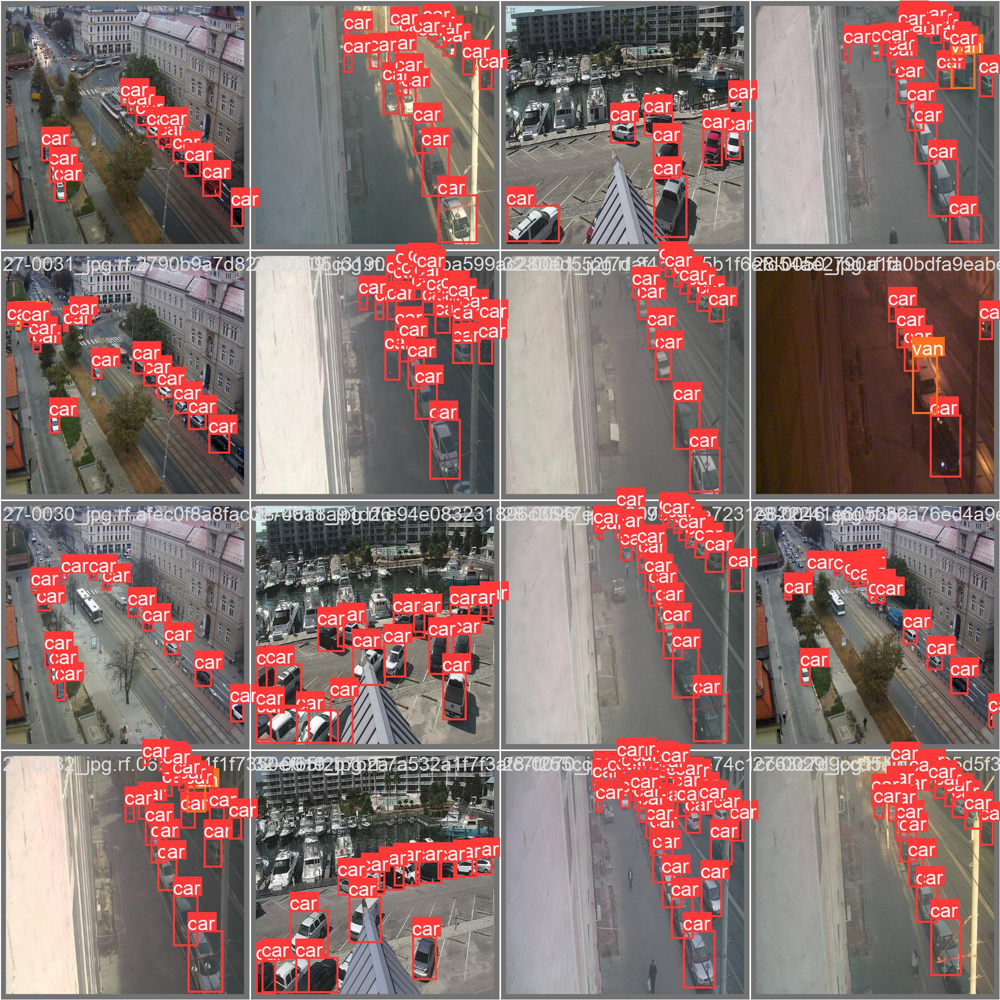

In [ ]:
%cd {HOME}
Image(filename='/content/runs/detect/val2/val_batch1_labels.jpg', width=600)

/content


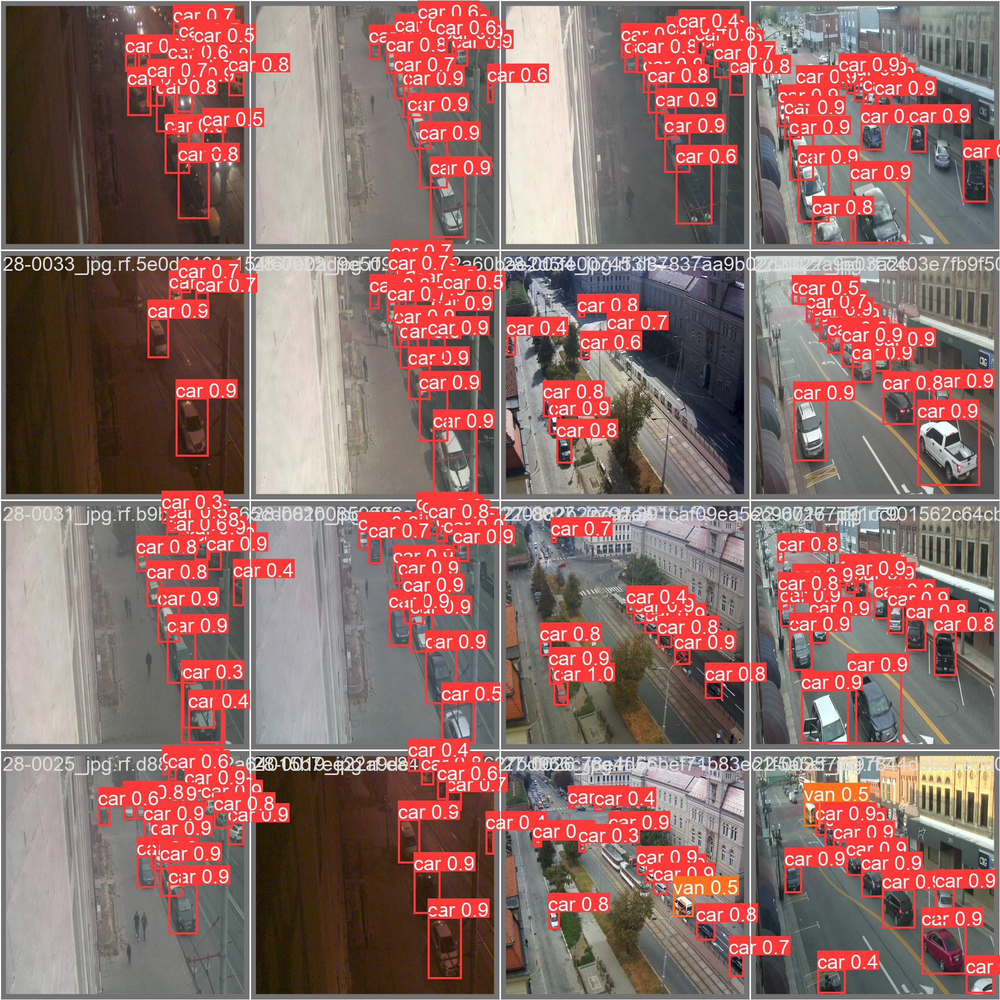

In [ ]:
%cd {HOME}
Image(filename='/content/runs/detect/val2/val_batch2_pred.jpg', width=600)

/content


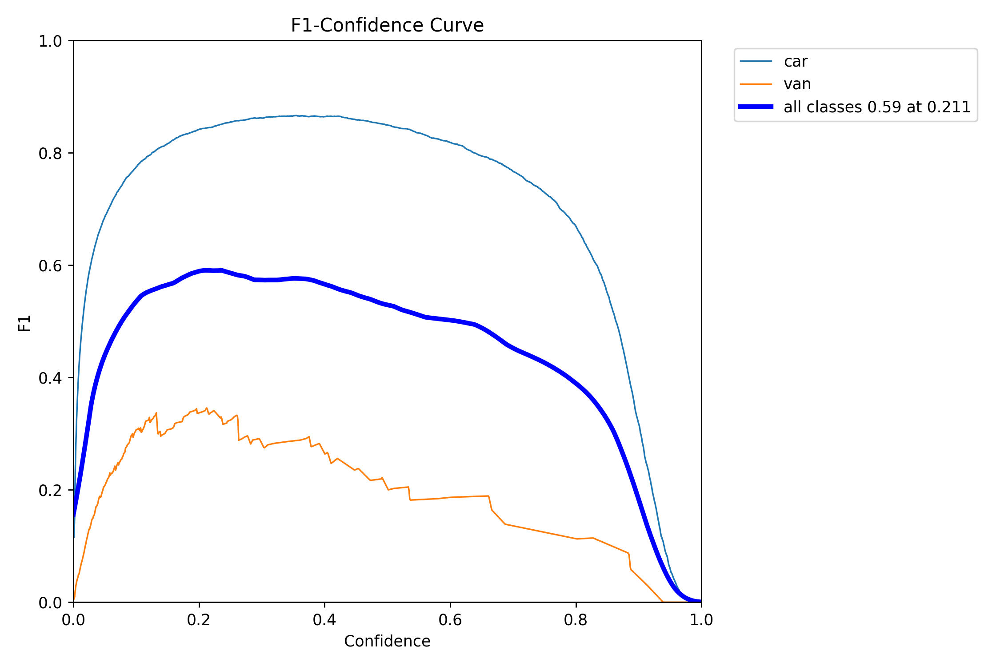

In [ ]:
%cd {HOME}
Image(filename='/content/runs/detect/val2/F1_curve.png', width=600)

/content


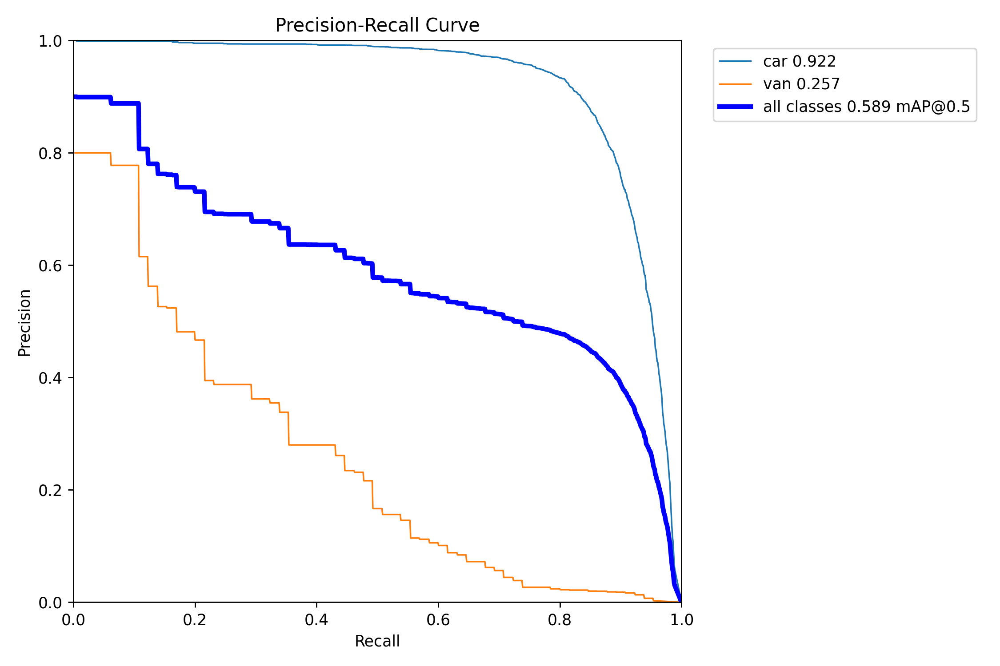

In [ ]:
%cd {HOME}
Image(filename='/content/runs/detect/val2/PR_curve.png', width=600)

/content


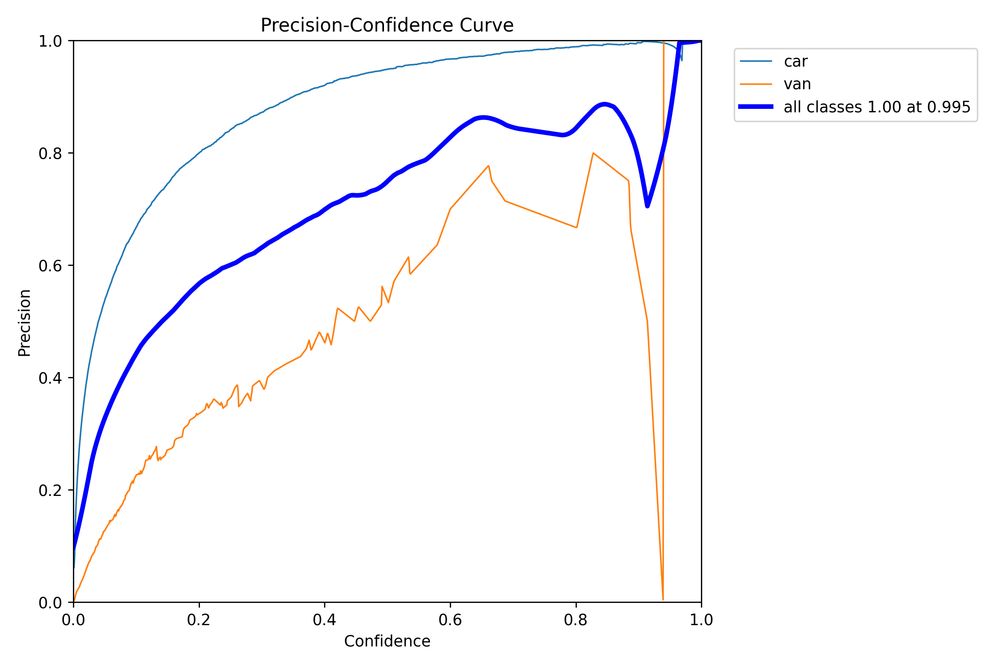

In [ ]:
%cd {HOME}
Image(filename='/content/runs/detect/val2/P_curve.png', width=600)

/content


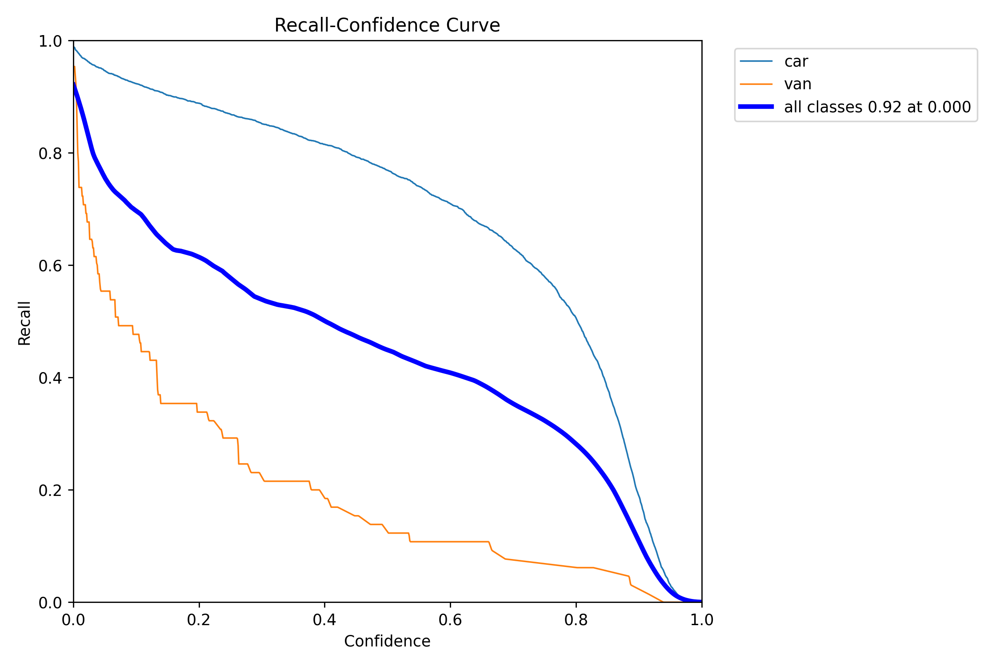

In [ ]:
%cd {HOME}
Image(filename='/content/runs/detect/val2/R_curve.png', width=600)

/content


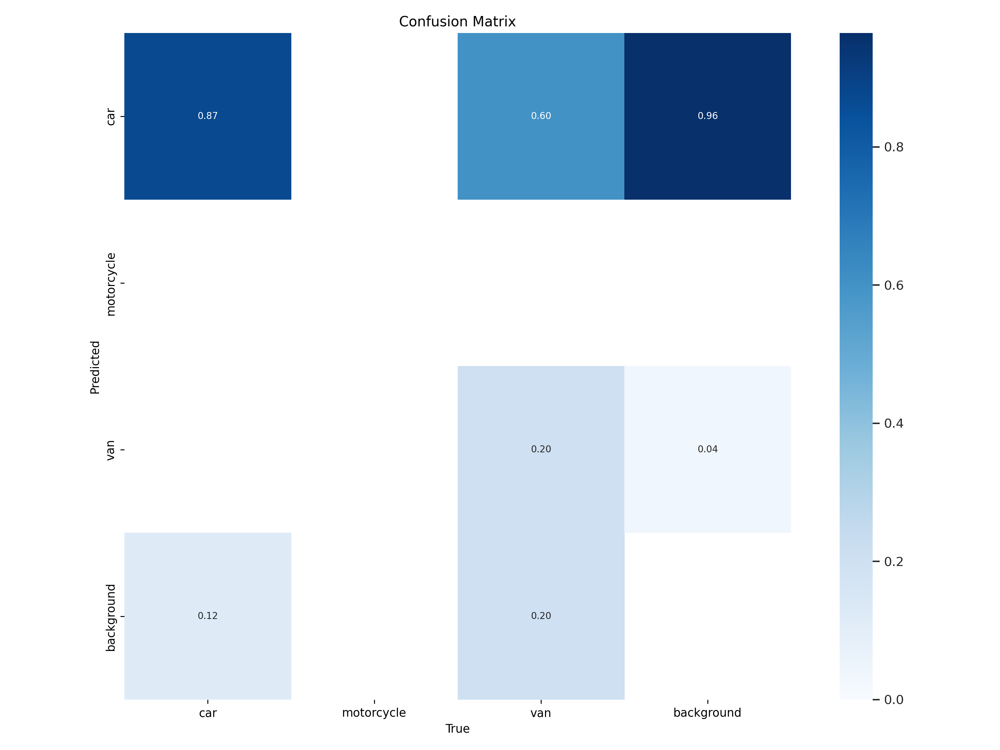

In [ ]:
%cd {HOME}
Image(filename='/content/runs/detect/val2/confusion_matrix.png', width=600)

## Predict on the test set

In [ ]:
# %cd {HOME}
# !yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

In [ ]:
# # download results

# !zip -r /content/with_training.zip /content/runs/detect/predict2

# from google.colab import files
# files.download('/content/with_training.zip')